In [19]:
# Import necessary libraries;
import numpy as np
from numpy import mean
from numpy import std


import pandas as pd

import matplotlib.pyplot as plt
from scipy import stats

# use seaborn plotting defaults
import seaborn as sns; sns.set_style('white')

from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)


from mpl_toolkits.mplot3d import Axes3D
from numpy import genfromtxt
import sklearn.metrics as metrics
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn import svm
from sklearn.datasets import load_digits, make_blobs
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, plot_confusion_matrix
from sklearn.model_selection import KFold, train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler, MaxAbsScaler, StandardScaler 
from sklearn.preprocessing import RobustScaler, Normalizer, QuantileTransformer, PowerTransformer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score
from sklearn import tree
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import LabelEncoder

In [13]:
print(np.logspace(-4, 4, 9))

[1.e-04 1.e-03 1.e-02 1.e-01 1.e+00 1.e+01 1.e+02 1.e+03 1.e+04]


In [38]:
fireWall = pd.read_csv('log2.csv')

fireWallXData = fireWall[['Source Port', 'Destination Port','NAT Source Port',
                         'NAT Destination Port','Bytes','Bytes Sent','Bytes Received','Packets',
                        'Elapsed Time (sec)','pkts_sent','pkts_received']]
fireWallyData = fireWall[['Action']]

X = fireWallXData.iloc[:,0:10]
y = fireWallyData.iloc[:,0]


print(y.shape)
print(X.shape)

#print(fireWall.shape)

FireWALLData = pd.concat([X, y], axis=1)
print(FireWALLData.shape)

newX = FireWALLData.iloc[:,0:9]
newy = FireWALLData.iloc[:,10]
FireWALLData.head()


#ncodeLabel = LabelEncoder()
#encodeLabel.fit_transform(FireWALLData.iloc[:,10])

(65532,)
(65532, 10)
(65532, 11)


,Source Port,Destination Port,NAT Source Port,NAT Destination Port,Bytes,Bytes Sent,Bytes Received,Packets,Elapsed Time (sec),pkts_sent,Action
0,57222,53,54587,53,177,94,83,2,30,1,allow
1,56258,3389,56258,3389,4768,1600,3168,19,17,10,allow
2,6881,50321,43265,50321,238,118,120,2,1199,1,allow
3,50553,3389,50553,3389,3327,1438,1889,15,17,8,allow
4,50002,443,45848,443,25358,6778,18580,31,16,13,allow


In [39]:
FireWALLData.head()

,Source Port,Destination Port,NAT Source Port,NAT Destination Port,Bytes,Bytes Sent,Bytes Received,Packets,Elapsed Time (sec),pkts_sent,Action
0,57222,53,54587,53,177,94,83,2,30,1,allow
1,56258,3389,56258,3389,4768,1600,3168,19,17,10,allow
2,6881,50321,43265,50321,238,118,120,2,1199,1,allow
3,50553,3389,50553,3389,3327,1438,1889,15,17,8,allow
4,50002,443,45848,443,25358,6778,18580,31,16,13,allow


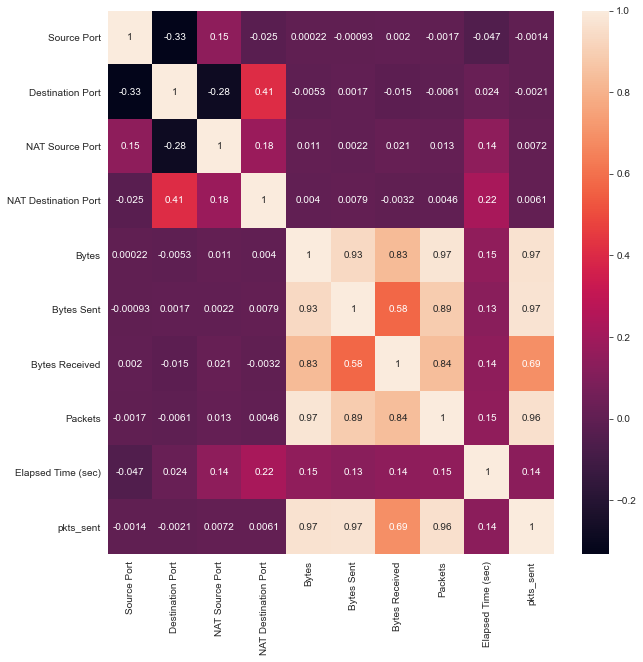

In [85]:
corrMatrix = FireWALLData.corr()
fig, ax = plt.subplots(figsize=(10,10))  
sns.heatmap(corrMatrix, annot=True)


plt.show()

In [82]:
fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = encodeLabel.fit_transform(FireWALLData['Action']),
                   colorscale = 'Rainbow',
                   cauto = True),
             dimensions = list([
             dict(range = [FireWALLData['Source Port'].min() ,FireWALLData['Source Port'].max()],
                 label = "Source Port", values = FireWALLData['Source Port']),
             dict(range = [FireWALLData['NAT Source Port'].min() ,FireWALLData['NAT Source Port'].max()],
                 label = 'NAT Source Port', values = FireWALLData['NAT Source Port']),
             dict(range = [FireWALLData['Bytes'].min() ,FireWALLData['Bytes'].max()],
                 label = 'Bytes', values = FireWALLData['Bytes']),
             dict(range = [FireWALLData['Bytes Sent'].min() ,FireWALLData['Bytes Sent'].max()],
                 label = 'Bytes Sent', values = FireWALLData['Bytes Sent']),
             dict(range = [FireWALLData['Packets'].min() ,FireWALLData['Packets'].max()],
                 label = 'Packets', values = FireWALLData['Packets']),
             dict(range = [FireWALLData['Elapsed Time (sec)'].min() ,FireWALLData['Elapsed Time (sec)'].max()],
                 label = 'Elapsed Time (sec)', values = FireWALLData['Elapsed Time (sec)']),
             dict(range = [FireWALLData['Destination Port'].min() ,FireWALLData['Destination Port'].max()],
                 label = 'Destination Port', values = FireWALLData['Destination Port']),
             dict(range = [FireWALLData['NAT Destination Port'].min() ,FireWALLData['NAT Destination Port'].max()],
                 label = 'NAT Destination Port', values = FireWALLData['NAT Destination Port'])])
    )
)
               
fig.show()

In [3]:

from sklearn.preprocessing import LabelEncoder
encodeLabel = LabelEncoder()
newy = encodeLabel.fit_transform(newy)
print(newy)
X_train, X_test, y_train, y_test = train_test_split( newX, newy, test_size=60000, random_state=1738)


[0 0 0 ... 2 2 2]


# LOGISTIC REGRESSION TRIAL ONE ON Fire Wall DATASET

In [4]:
import warnings
warnings.filterwarnings('ignore')

ITERATIONS = 1
for i in range(1):
    #For reach "trial", randomly select 5000 data points
    random5000DataPoints = FireWALLData.sample(n = 25000, replace = True)
    #From that 5000, create x set and y set
    xSet = random5000DataPoints.iloc[:,0:9].values
    ySet = random5000DataPoints.iloc[:,10].values
    ySet = encodeLabel.fit_transform(ySet)
    
    pipe = Pipeline([('std', StandardScaler()),('classifier', LogisticRegression(n_jobs = -1))])

    search_space = [
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['saga'],
                 'classifier__penalty': ['l1', 'l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['lbfgs'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                
                'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                'classifier__solver': ['lbfgs','saga','newton-cg','liblinear'],
                'classifier__penalty': ['none']},
        
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['newton-cg'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['liblinear'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)}
                
                ]
    #'precision_micro','roc_auc_ovo','jaccard','neg_log_loss'] JACCARD DOES NOT WORK FOR NON BINARY?
    runHyperParamSearch = GridSearchCV(pipe, search_space, cv=StratifiedKFold(n_splits=5), 
                          scoring=['recall_micro','f1_micro','roc_auc_ovo','neg_log_loss'], 
                          refit=False, verbose=10, n_jobs = -1)
    TRIAL_1 = runHyperParamSearch.fit(xSet, ySet)
    print("---------------------------------TRIAL ONE RESULTS ---------------------------------------------")

Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   45.2s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 149 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 189 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 210 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 239 out of 245 | elapsed:  

---------------------------------TRIAL ONE RESULTS ---------------------------------------------


[Parallel(n_jobs=-1)]: Done 245 out of 245 | elapsed:  7.8min finished


In [5]:
TRIAL_1.cv_results_

{'mean_fit_time': array([1.35716295e-01, 1.78353367e+00, 6.04249601e+00, 4.75909281e+00,
        4.09541199e+01, 1.00278235e+01, 9.98305525e+01, 3.48046316e+01,
        1.11633002e+02, 7.33885128e+01, 1.18252276e+02, 8.30985633e+01,
        1.21426925e+02, 8.41622780e+01, 1.23999838e+02, 8.57803695e+01,
        1.30338989e+02, 9.76150475e+01, 2.63627005e-01, 2.57921934e-01,
        4.25748587e-01, 7.85375357e-01, 1.57835746e+00, 2.53788261e+00,
        5.72892680e+00, 9.03577056e+00, 1.49654704e+01, 3.29001937e+01,
        7.16961571e+01, 2.46047603e+01, 1.76150322e-02, 9.87548971e-01,
        1.02278008e+00, 9.56622934e-01, 1.00106072e+00, 1.33664947e+00,
        2.01062932e+00, 2.52116861e+00, 3.62641921e+00, 4.73647304e+00,
        2.70832300e-01, 4.10352659e-01, 6.31843519e-01, 8.80456924e-01,
        1.04489865e+00, 1.25708065e+00, 1.78933964e+00, 2.02864494e+00,
        1.90964074e+00]),
 'std_fit_time': array([6.53562828e-03, 8.67436869e-02, 4.14502293e-01, 2.17656287e-01,
     

In [6]:
print("---------------------------------TRIAL ONE NEG LOG LOSS RESULTS ---------------------------------------------")
TRIAL_1.cv_results_['rank_test_neg_log_loss']
TRIAL_1.cv_results_['params'][ np.argmin(TRIAL_1.cv_results_['rank_test_neg_log_loss']) ]

---------------------------------TRIAL ONE NEG LOG LOSS RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__penalty': 'none',
 'classifier__solver': 'newton-cg'}

In [7]:
print("---------------------------------TRIAL ONE F1 RESULTS ---------------------------------------------")
TRIAL_1.cv_results_['rank_test_f1_micro']
TRIAL_1.cv_results_['params'][ np.argmin(TRIAL_1.cv_results_['rank_test_f1_micro']) ]

---------------------------------TRIAL ONE F1 RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__penalty': 'none',
 'classifier__solver': 'lbfgs'}

In [8]:
print("---------------------------------TRIAL ONE ROC AUC RESULTS ---------------------------------------------")
TRIAL_1.cv_results_['rank_test_roc_auc_ovo']
TRIAL_1.cv_results_['params'][ np.argmin(TRIAL_1.cv_results_['rank_test_roc_auc_ovo']) ]

---------------------------------TRIAL ONE ROC AUC RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__penalty': 'none',
 'classifier__solver': 'lbfgs'}

In [9]:
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best NEG LOG LOSS results to train on test set, 
p = TRIAL_1.cv_results_['params'][ np.argmin(TRIAL_1.cv_results_['rank_test_neg_log_loss']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train__neg_log_loss = pipe.predict(X_train)
y_pred_test_neg_log_loss = pipe.predict(X_test)
print('Accuracy of Trial 1 Logistic Regression using best NEG LOG LOSS hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_neg_log_loss)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best F1 results to train on test set, LR_Trial 1
p = TRIAL_1.cv_results_['params'][ np.argmin(TRIAL_1.cv_results_['rank_test_f1_micro']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train_roc_auc = pipe.predict(X_train)
y_pred_test_f1 = pipe.predict(X_test)
print('Accuracy of Trial 1 Logistic Regression using best F1 hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_f1)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best ROC_AUC results to train on test set, LR_Trial 1
p  = TRIAL_1.cv_results_['params'][ np.argmin(TRIAL_1.cv_results_['rank_test_roc_auc_ovo']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train_roc_auc = pipe.predict(X_train)
y_pred_test_roc_auc = pipe.predict(X_test)
print('Accuracy of Trial 1 Logistic Regression using best ROC_AUC hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_roc_auc)))
print("------------------------------------------------------------------------------------------------")


------------------------------------------------------------------------------------------------
Accuracy of Trial 1 Logistic Regression using best NEG LOG LOSS hyperparameters :0.9908166666666667
------------------------------------------------------------------------------------------------
Accuracy of Trial 1 Logistic Regression using best F1 hyperparameters :0.99075
------------------------------------------------------------------------------------------------
Accuracy of Trial 1 Logistic Regression using best ROC_AUC hyperparameters :0.99075
------------------------------------------------------------------------------------------------


# LOGISTIC REGRESSION TRIAL TWO ON Fire Wall DATASET

In [10]:
ITERATIONS = 1
for i in range(1):
    #For reach "trial", randomly select 5000 data points
    random5000DataPoints = FireWALLData.sample(n = 25000, replace = True)
    #From that 5000, create x set and y set
    xSet = random5000DataPoints.iloc[:,0:9].values
    ySet = random5000DataPoints.iloc[:,10].values
    ySet = encodeLabel.fit_transform(ySet)
    
    pipe = Pipeline([('std', StandardScaler()),('classifier', LogisticRegression(n_jobs = -1))])

    search_space = [
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['saga'],
                 'classifier__penalty': ['l1', 'l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['lbfgs'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                
                'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                'classifier__solver': ['lbfgs','saga','newton-cg','liblinear'],
                'classifier__penalty': ['none']},
        
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['newton-cg'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['liblinear'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)}
                
                ]
    
    runHyperParamSearch = GridSearchCV(pipe, search_space, cv=StratifiedKFold(n_splits=5), 
                          scoring=['recall_micro','f1_micro','roc_auc_ovo','neg_log_loss'], 
                          refit=False, verbose=10, n_jobs = -1)
    TRIAL_2 = runHyperParamSearch.fit(xSet, ySet)
    print("---------------------------------TRIAL TWO RESULTS ---------------------------------------------")

Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1521s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   38.7s
[Parallel(n_jobs=-1)]: Batch computation too slow (59.1384s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done  85 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 118 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 139 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 157 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 177 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  7.5min
[Parallel(n_

---------------------------------TRIAL TWO RESULTS ---------------------------------------------


[Parallel(n_jobs=-1)]: Done 245 out of 245 | elapsed:  8.1min finished


In [11]:
TRIAL_2.cv_results_

{'mean_fit_time': array([1.31012583e-01, 1.26298556e+00, 3.56496520e+00, 3.34217391e+00,
        3.68880227e+01, 8.22677474e+00, 1.03469782e+02, 2.63005178e+01,
        1.13788055e+02, 6.85908866e+01, 1.30787575e+02, 8.71024064e+01,
        1.34673116e+02, 8.84133337e+01, 1.38217965e+02, 9.60294832e+01,
        1.30117699e+02, 9.25177633e+01, 2.60123444e-01, 2.47212601e-01,
        3.47198296e-01, 8.82859135e-01, 1.66212926e+00, 2.84144340e+00,
        5.09117808e+00, 8.00868740e+00, 1.79224126e+01, 5.41861995e+01,
        8.39605052e+01, 1.78626617e+01, 1.43121719e-02, 9.23293877e-01,
        8.93167925e-01, 7.88478136e-01, 8.41222811e-01, 1.19963164e+00,
        1.57975841e+00, 2.09089823e+00, 2.95954466e+00, 4.63368497e+00,
        1.47426224e-01, 2.03375912e-01, 3.46397257e-01, 4.04347610e-01,
        7.16015577e-01, 8.84259653e-01, 1.02718301e+00, 1.45535192e+00,
        1.42042079e+00]),
 'std_fit_time': array([3.56753180e-02, 1.65847500e-01, 6.41534438e-01, 3.56673696e-01,
     

In [12]:
print("---------------------------------TRIAL TWO NEG LOG LOSS RESULTS ---------------------------------------------")
TRIAL_2.cv_results_['rank_test_neg_log_loss']
TRIAL_2.cv_results_['params'][ np.argmin(TRIAL_2.cv_results_['rank_test_neg_log_loss']) ]

---------------------------------TRIAL TWO NEG LOG LOSS RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__penalty': 'none',
 'classifier__solver': 'newton-cg'}

In [13]:
print("---------------------------------TRIAL TWO F1 RESULTS ---------------------------------------------")
TRIAL_2.cv_results_['rank_test_f1_micro']
TRIAL_2.cv_results_['params'][ np.argmin(TRIAL_2.cv_results_['rank_test_f1_micro']) ]

---------------------------------TRIAL TWO F1 RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__penalty': 'none',
 'classifier__solver': 'newton-cg'}

In [14]:
print("---------------------------------TRIAL TWO ROC AUC RESULTS ---------------------------------------------")
TRIAL_2.cv_results_['rank_test_roc_auc_ovo']
TRIAL_2.cv_results_['params'][ np.argmin(TRIAL_2.cv_results_['rank_test_roc_auc_ovo']) ]

---------------------------------TRIAL TWO ROC AUC RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 10000.0,
 'classifier__penalty': 'l2',
 'classifier__solver': 'lbfgs'}

In [15]:

print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best NEG LOG LOSS results to train on test set, 
p = TRIAL_2.cv_results_['params'][ np.argmin(TRIAL_2.cv_results_['rank_test_neg_log_loss']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train__neg_log_loss = pipe.predict(X_train)
y_pred_test_neg_log_loss = pipe.predict(X_test)
print('Accuracy of Trial 2 Logistic Regression using best NEG LOG LOSS hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_neg_log_loss)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best F1 results to train on test set, LR_Trial 1
p = TRIAL_2.cv_results_['params'][ np.argmin(TRIAL_2.cv_results_['rank_test_f1_micro']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train_roc_auc = pipe.predict(X_train)
y_pred_test_f1 = pipe.predict(X_test)
print('Accuracy of Trial 2 Logistic Regression using best F1 hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_f1)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best ROC_AUC results to train on test set, LR_Trial 1
p  = TRIAL_2.cv_results_['params'][ np.argmin(TRIAL_2.cv_results_['rank_test_roc_auc_ovo']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train_roc_auc = pipe.predict(X_train)
y_pred_test_roc_auc = pipe.predict(X_test)
print('Accuracy of Trial 2 Logistic Regression using best ROC_AUC hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_roc_auc)))
print("------------------------------------------------------------------------------------------------")


------------------------------------------------------------------------------------------------
Accuracy of Trial 2 Logistic Regression using best NEG LOG LOSS hyperparameters :0.9908166666666667
------------------------------------------------------------------------------------------------
Accuracy of Trial 2 Logistic Regression using best F1 hyperparameters :0.9908166666666667
------------------------------------------------------------------------------------------------
Accuracy of Trial 2 Logistic Regression using best ROC_AUC hyperparameters :0.9897333333333334
------------------------------------------------------------------------------------------------


# LOGISTIC REGRESSION TRIAL THREE ON Fire Wall  DATASET

In [16]:
ITERATIONS = 1
for i in range(1):
    #For reach "trial", randomly select 5000 data points
    random5000DataPoints = FireWALLData.sample(n = 25000, replace = True)
    #From that 5000, create x set and y set
    xSet = random5000DataPoints.iloc[:,0:9].values
    ySet = random5000DataPoints.iloc[:,10].values
    ySet = encodeLabel.fit_transform(ySet)
    
    pipe = Pipeline([('std', StandardScaler()),('classifier', LogisticRegression(n_jobs = -1))])

    search_space = [
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['saga'],
                 'classifier__penalty': ['l1', 'l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['lbfgs'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                
                'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                'classifier__solver': ['lbfgs','saga','newton-cg','liblinear'],
                'classifier__penalty': ['none']},
        
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['newton-cg'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['liblinear'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)}
                
                ]
    
    runHyperParamSearch = GridSearchCV(pipe, search_space, cv=StratifiedKFold(n_splits=5), 
                          scoring=['recall_micro','f1_micro','roc_auc_ovo','neg_log_loss'], 
                          refit=False, verbose=10, n_jobs = -1)
    TRIAL_3 = runHyperParamSearch.fit(xSet, ySet)
    print("---------------------------------TRIAL THREE RESULTS ---------------------------------------------")

Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1381s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   41.2s
[Parallel(n_jobs=-1)]: Batch computation too slow (77.8695s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 119 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 177 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  7.6min
[Parallel(n_

---------------------------------TRIAL THREE RESULTS ---------------------------------------------


[Parallel(n_jobs=-1)]: Done 245 out of 245 | elapsed:  8.3min finished


In [17]:
TRIAL_3.cv_results_

{'mean_fit_time': array([1.90363646e-01, 1.67744236e+00, 5.61723084e+00, 4.50957780e+00,
        3.90565874e+01, 9.39908314e+00, 1.04413393e+02, 3.53944384e+01,
        1.18131881e+02, 7.77304466e+01, 1.27253536e+02, 8.82971337e+01,
        1.35498826e+02, 9.12747945e+01, 1.38684766e+02, 9.58557340e+01,
        1.31866303e+02, 9.36720562e+01, 2.27295303e-01, 2.75436687e-01,
        4.81113768e-01, 7.89879227e-01, 1.49258337e+00, 2.13443575e+00,
        4.32341776e+00, 8.48139391e+00, 1.60025618e+01, 4.87314083e+01,
        8.76410697e+01, 1.62312584e+01, 1.43122196e-02, 7.09509993e-01,
        7.70562649e-01, 7.59653187e-01, 8.11297655e-01, 1.20403538e+00,
        1.54983287e+00, 2.16396122e+00, 2.70932999e+00, 3.94479156e+00,
        1.52831316e-01, 2.46511364e-01, 3.99543571e-01, 5.20547056e-01,
        7.06407595e-01, 8.10697365e-01, 1.10104690e+00, 1.37037802e+00,
        3.14870734e+00]),
 'std_fit_time': array([4.92660178e-02, 1.40111323e-01, 4.61214154e-01, 2.95884851e-01,
     

In [18]:
print("---------------------------------TRIAL THREE NEG LOG LOSS RESULTS ---------------------------------------------")
TRIAL_3.cv_results_['rank_test_neg_log_loss']
TRIAL_3.cv_results_['params'][ np.argmin(TRIAL_3.cv_results_['rank_test_neg_log_loss']) ]

---------------------------------TRIAL THREE NEG LOG LOSS RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__penalty': 'none',
 'classifier__solver': 'newton-cg'}

In [19]:
print("---------------------------------TRIAL THREE F1 RESULTS ---------------------------------------------")
TRIAL_3.cv_results_['rank_test_f1_micro']
TRIAL_3.cv_results_['params'][ np.argmin(TRIAL_3.cv_results_['rank_test_f1_micro']) ]

---------------------------------TRIAL THREE F1 RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__penalty': 'none',
 'classifier__solver': 'newton-cg'}

In [20]:
print("---------------------------------TRIAL THREE ROC AUC RESULTS ---------------------------------------------")
TRIAL_3.cv_results_['rank_test_roc_auc_ovo']
TRIAL_3.cv_results_['params'][ np.argmin(TRIAL_3.cv_results_['rank_test_roc_auc_ovo']) ]

---------------------------------TRIAL THREE ROC AUC RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__penalty': 'none',
 'classifier__solver': 'lbfgs'}

In [21]:

print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best NEG LOG LOSS results to train on test set, 
p = TRIAL_3.cv_results_['params'][ np.argmin(TRIAL_3.cv_results_['rank_test_neg_log_loss']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train__neg_log_loss = pipe.predict(X_train)
y_pred_test_neg_log_loss = pipe.predict(X_test)
print('Accuracy of Trial 3 Logistic Regression using best NEG LOG LOSS hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_neg_log_loss)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best F1 results to train on test set, LR_Trial 1
p = TRIAL_3.cv_results_['params'][ np.argmin(TRIAL_3.cv_results_['rank_test_f1_micro']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train_roc_auc = pipe.predict(X_train)
y_pred_test_f1 = pipe.predict(X_test)
print('Accuracy of Trial 3 Logistic Regression using best F1 hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_f1)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best ROC_AUC results to train on test set, LR_Trial 1
p  = TRIAL_3.cv_results_['params'][ np.argmin(TRIAL_3.cv_results_['rank_test_roc_auc_ovo']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train_roc_auc = pipe.predict(X_train)
y_pred_test_roc_auc = pipe.predict(X_test)
print('Accuracy of Trial 3 Logistic Regression using best ROC_AUC hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_roc_auc)))


------------------------------------------------------------------------------------------------
Accuracy of Trial 3 Logistic Regression using best NEG LOG LOSS hyperparameters :0.9908166666666667
------------------------------------------------------------------------------------------------
Accuracy of Trial 3 Logistic Regression using best F1 hyperparameters :0.9908166666666667
------------------------------------------------------------------------------------------------
Accuracy of Trial 3 Logistic Regression using best ROC_AUC hyperparameters :0.99075


# LOGISTIC REGRESSION TRIAL FOUR ON Fire Wall DATASET

In [22]:
ITERATIONS = 1
for i in range(1):
    #For reach "trial", randomly select 5000 data points
    random5000DataPoints = FireWALLData.sample(n = 25000, replace = True)
    #From that 5000, create x set and y set
    xSet = random5000DataPoints.iloc[:,0:9].values
    ySet = random5000DataPoints.iloc[:,10].values
    ySet = encodeLabel.fit_transform(ySet)
    
    pipe = Pipeline([('std', StandardScaler()),('classifier', LogisticRegression(n_jobs = -1))])

    search_space = [
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['saga'],
                 'classifier__penalty': ['l1', 'l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['lbfgs'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                
                'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                'classifier__solver': ['lbfgs','saga','newton-cg','liblinear'],
                'classifier__penalty': ['none']},
        
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['newton-cg'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['liblinear'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)}
                
                ]
    
    runHyperParamSearch = GridSearchCV(pipe, search_space, cv=StratifiedKFold(n_splits=5), 
                          scoring=['recall_micro','f1_micro','roc_auc_ovo','neg_log_loss'], 
                          refit=False, verbose=10, n_jobs = -1)
    TRIAL_4 = runHyperParamSearch.fit(xSet, ySet)
    print("---------------------------------TRIAL FOUR RESULTS ---------------------------------------------")

Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1571s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   45.2s
[Parallel(n_jobs=-1)]: Batch computation too slow (68.0295s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  71 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 101 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 118 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 195 tasks      | elapsed:  7.8min
[Parallel(n_

---------------------------------TRIAL FOUR RESULTS ---------------------------------------------


[Parallel(n_jobs=-1)]: Done 245 out of 245 | elapsed:  8.3min finished


In [23]:
TRIAL_4.cv_results_

{'mean_fit_time': array([1.16700125e-01, 1.63040214e+00, 5.03142643e+00, 4.41619740e+00,
        4.35752740e+01, 1.04878195e+01, 1.10738833e+02, 3.25349792e+01,
        1.21133272e+02, 7.86029971e+01, 1.29422501e+02, 9.07401346e+01,
        1.32930918e+02, 9.02634246e+01, 1.36781529e+02, 9.89643767e+01,
        1.30172646e+02, 9.56828853e+01, 2.50215101e-01, 2.60524035e-01,
        3.56106043e-01, 7.35632563e-01, 1.46956358e+00, 2.38615208e+00,
        4.71605544e+00, 1.21537521e+01, 1.86440334e+01, 5.10558071e+01,
        8.71482462e+01, 2.40304664e+01, 1.54132366e-02, 8.24208879e-01,
        8.22307301e-01, 8.04792356e-01, 8.39822245e-01, 1.02297978e+00,
        1.45465078e+00, 1.95327950e+00, 2.70122285e+00, 3.86922765e+00,
        1.41021395e-01, 1.96368980e-01, 3.33786678e-01, 5.58380222e-01,
        5.39062691e-01, 6.92095375e-01, 8.15201378e-01, 9.61727619e-01,
        1.21834702e+00]),
 'std_fit_time': array([7.35054256e-03, 2.00665898e-01, 6.11598507e-01, 3.47995110e-01,
     

In [24]:
print("---------------------------------TRIAL FOUR NEG LOG LOSS RESULTS ---------------------------------------------")
TRIAL_4.cv_results_['rank_test_neg_log_loss']
TRIAL_4.cv_results_['params'][ np.argmin(TRIAL_4.cv_results_['rank_test_neg_log_loss']) ]

---------------------------------TRIAL FOUR NEG LOG LOSS RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__penalty': 'none',
 'classifier__solver': 'lbfgs'}

In [25]:
print("---------------------------------TRIAL FOUR F1 RESULTS ---------------------------------------------")
TRIAL_4.cv_results_['rank_test_f1_micro']
TRIAL_4.cv_results_['params'][ np.argmin(TRIAL_4.cv_results_['rank_test_f1_micro']) ]

---------------------------------TRIAL FOUR F1 RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__penalty': 'none',
 'classifier__solver': 'newton-cg'}

In [26]:
print("---------------------------------TRIAL FOUR ROC AUC RESULTS ---------------------------------------------")
TRIAL_4.cv_results_['rank_test_roc_auc_ovo']
TRIAL_4.cv_results_['params'][ np.argmin(TRIAL_4.cv_results_['rank_test_roc_auc_ovo']) ]

---------------------------------TRIAL FOUR ROC AUC RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 10000.0,
 'classifier__penalty': 'l2',
 'classifier__solver': 'newton-cg'}

In [27]:

print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best NEG LOG LOSS results to train on test set, 
p = TRIAL_4.cv_results_['params'][ np.argmin(TRIAL_4.cv_results_['rank_test_neg_log_loss']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train__neg_log_loss = pipe.predict(X_train)
y_pred_test_neg_log_loss = pipe.predict(X_test)
print('Accuracy of Trial 4 Logistic Regression using best NEG LOG LOSS hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_neg_log_loss)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best F1 results to train on test set, LR_Trial 1
p = TRIAL_4.cv_results_['params'][ np.argmin(TRIAL_4.cv_results_['rank_test_f1_micro']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train_roc_auc = pipe.predict(X_train)
y_pred_test_f1 = pipe.predict(X_test)
print('Accuracy of Trial 4 Logistic Regression using best F1 hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_f1)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best ROC_AUC results to train on test set, LR_Trial 1
p  = TRIAL_4.cv_results_['params'][ np.argmin(TRIAL_4.cv_results_['rank_test_roc_auc_ovo']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train_roc_auc = pipe.predict(X_train)
y_pred_test_roc_auc = pipe.predict(X_test)
print('Accuracy of Trial 4 Logistic Regression using best ROC_AUC hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_roc_auc)))
print("------------------------------------------------------------------------------------------------")


------------------------------------------------------------------------------------------------
Accuracy of Trial 4 Logistic Regression using best NEG LOG LOSS hyperparameters :0.99075
------------------------------------------------------------------------------------------------
Accuracy of Trial 4 Logistic Regression using best F1 hyperparameters :0.9908166666666667
------------------------------------------------------------------------------------------------
Accuracy of Trial 4 Logistic Regression using best ROC_AUC hyperparameters :0.9897333333333334
------------------------------------------------------------------------------------------------


# LOGISTIC REGRESSION TRIAL FIVE ON Fire Wall DATASET

In [28]:
ITERATIONS = 1
for i in range(1):
    #For reach "trial", randomly select 5000 data points
    random5000DataPoints = FireWALLData.sample(n = 25000, replace = True)
    #From that 5000, create x set and y set
    xSet = random5000DataPoints.iloc[:,0:9].values
    ySet = random5000DataPoints.iloc[:,10].values
    ySet = encodeLabel.fit_transform(ySet)
    
    pipe = Pipeline([('std', StandardScaler()),('classifier', LogisticRegression(n_jobs = -1))])

    search_space = [
                {
                 
                 'classifier': [LogisticRegression(n_jobs = -1)],
                 'classifier__solver': ['saga'],
                 'classifier__penalty': ['l1', 'l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 
                 'classifier': [LogisticRegression(n_jobs = -1)],
                 'classifier__solver': ['lbfgs'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                
                'classifier': [LogisticRegression(n_jobs = -1)],
                'classifier__solver': ['lbfgs','saga','newton-cg','liblinear'],
                'classifier__penalty': ['none']},
        
                {
                 
                 'classifier': [LogisticRegression(n_jobs = -1)],
                 'classifier__solver': ['newton-cg'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 'classifier': [LogisticRegression(n_jobs = -1)],
                 'classifier__solver': ['liblinear'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)}
                
                ]
    
    runHyperParamSearch = GridSearchCV(pipe, search_space, cv=StratifiedKFold(n_splits=5), 
                          scoring=['recall_micro','f1_micro','roc_auc_ovo','neg_log_loss'], 
                          refit=False, verbose=10, n_jobs = -1)
    TRIAL_5 = runHyperParamSearch.fit(xSet, ySet)
    print("---------------------------------TRIAL FIVE RESULTS ---------------------------------------------")

Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1456s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Batch computation too slow (4.6190s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done 110 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:   14.2s
[Parallel(n_jobs=-1)]: Done 162 tasks      | elapsed:   16.4s
[Parallel(n_jobs=-1)]: Done 181 tasks      | elapsed:   21.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:   24.8s
[Parallel(n_j

---------------------------------TRIAL FIVE RESULTS ---------------------------------------------


[Parallel(n_jobs=-1)]: Done 245 out of 245 | elapsed:   31.2s finished


In [29]:
TRIAL_5.cv_results_

{'mean_fit_time': array([ 0.17745261,  1.41301503,  1.79984741,  1.47276669,  1.89883275,
         1.48187442,  1.92635651,  1.48197451,  2.06077209,  1.49668713,
         2.08339171,  1.45935445,  2.06417494,  1.51740499,  2.21270304,
         1.65552382,  2.38395028,  1.7772284 ,  0.22028928,  0.31196818,
         0.43457365,  0.79998765,  1.28560557,  1.29791617,  1.61178627,
         1.96188712,  1.81015596,  1.64261317,  2.04105453, 17.21782408,
         0.01821561,  1.17250767,  1.2705936 ,  1.37538247,  1.37668204,
         1.79374213,  2.51716337,  3.53764248,  4.72736459,  6.24557066,
         0.3440968 ,  0.55277429,  0.74534216,  1.0724225 ,  1.22114954,
         1.55853958,  1.76711903,  2.03915277,  1.35196214]),
 'std_fit_time': array([5.31829820e-02, 2.22540698e-01, 1.23131857e-02, 3.53837884e-02,
        4.27480815e-02, 3.64115397e-02, 1.77171043e-02, 2.74839661e-02,
        3.11038427e-02, 5.06343858e-02, 4.33701670e-02, 3.53309584e-02,
        3.36907454e-02, 3.591029

In [30]:
print("---------------------------------TRIAL FIVE NEG LOG LOSS RESULTS ---------------------------------------------")
TRIAL_5.cv_results_['rank_test_neg_log_loss']
TRIAL_5.cv_results_['params'][ np.argmin(TRIAL_5.cv_results_['rank_test_neg_log_loss']) ]

---------------------------------TRIAL FIVE NEG LOG LOSS RESULTS ---------------------------------------------


{'classifier': LogisticRegression(n_jobs=-1),
 'classifier__penalty': 'none',
 'classifier__solver': 'newton-cg'}

In [31]:
print("---------------------------------TRIAL FIVE F1 RESULTS ---------------------------------------------")
TRIAL_5.cv_results_['rank_test_f1_micro']
TRIAL_5.cv_results_['params'][ np.argmin(TRIAL_5.cv_results_['rank_test_f1_micro']) ]

---------------------------------TRIAL FIVE F1 RESULTS ---------------------------------------------


{'classifier': LogisticRegression(n_jobs=-1),
 'classifier__penalty': 'none',
 'classifier__solver': 'newton-cg'}

In [32]:
print("---------------------------------TRIAL FIVE ROC AUC RESULTS ---------------------------------------------")
TRIAL_5.cv_results_['rank_test_roc_auc_ovo']
TRIAL_5.cv_results_['params'][ np.argmin(TRIAL_5.cv_results_['rank_test_roc_auc_ovo']) ]

---------------------------------TRIAL FIVE ROC AUC RESULTS ---------------------------------------------


{'classifier': LogisticRegression(n_jobs=-1),
 'classifier__C': 10000.0,
 'classifier__penalty': 'l2',
 'classifier__solver': 'newton-cg'}

In [33]:

print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best NEG LOG LOSS results to train on test set, 
p = TRIAL_5.cv_results_['params'][ np.argmin(TRIAL_5.cv_results_['rank_test_neg_log_loss']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train__neg_log_loss = pipe.predict(X_train)
y_pred_test_neg_log_loss = pipe.predict(X_test)
print('Accuracy of Trial 5 Logistic Regression using best NEG LOG LOSS hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_neg_log_loss)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best F1 results to train on test set, LR_Trial 1
p = TRIAL_5.cv_results_['params'][ np.argmin(TRIAL_4.cv_results_['rank_test_f1_micro']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train_roc_auc = pipe.predict(X_train)
y_pred_test_f1 = pipe.predict(X_test)
print('Accuracy of Trial 5 Logistic Regression using best F1 hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_f1)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best ROC_AUC results to train on test set, LR_Trial 1
p  = TRIAL_5.cv_results_['params'][ np.argmin(TRIAL_5.cv_results_['rank_test_roc_auc_ovo']) ]
pipe.set_params(**p)
pipe.fit(X_train,y_train)
y_pred_train_roc_auc = pipe.predict(X_train)
y_pred_test_roc_auc = pipe.predict(X_test)
print('Accuracy of Trial 5 Logistic Regression using best ROC_AUC hyperparameters :'
      + str(accuracy_score(y_test,y_pred_test_roc_auc)))
print("------------------------------------------------------------------------------------------------")


------------------------------------------------------------------------------------------------
Accuracy of Trial 5 Logistic Regression using best NEG LOG LOSS hyperparameters :0.9907833333333333
------------------------------------------------------------------------------------------------
Accuracy of Trial 5 Logistic Regression using best F1 hyperparameters :0.9907833333333333
------------------------------------------------------------------------------------------------
Accuracy of Trial 5 Logistic Regression using best ROC_AUC hyperparameters :0.9897333333333334
------------------------------------------------------------------------------------------------
